# BOSTON CRIME DATA

BOSTON: Boston is the capital and most populous city of the Commonwealth of Massachusetts in the United States and the 21st most populous city in the United States[¹](https://ballotpedia.org/Largest_cities_in_the_United_States_by_population)

CRIME:


UCR: 


## Content
1. [Guiding Questions](#1)
2. [Gathering Data](#2)
   1. [Data Wrangling](#3)
3. [Interview the Data with Queries](#4)
4. [Conclusion](#5) 
5. [References](#6)


<a id = "1"></a><br>
## Guiding Questions
In the first step, I determined what I curious about Boston Crime Data in light of the above-mentioned information, and I wrote these down:

1. How has crime changed over the years?
1. What can you say about the distribution of different offenses over the city?
1. Is it possible to predict crime type will be committed?

I will use python libraries within the Jupyter notebook environment for Investigation these questions. The main software libraries I’ll be importing are Pandas, NumPy for data wrangling and Matplotlib, Plotly for data visualization.

In [1]:
!pip install cufflinks
!pip install folium

In [2]:
# import libraries 
# data cleaning
import math
import statistics
import numpy as np
import scipy.stats
from scipy import stats
import pandas as pd
#data visualization
from matplotlib import pyplot as plt
plt.style.use('ggplot')
import seaborn as sns

import cufflinks as cf
import folium

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False) 

import plotly.express as px
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()

<a id = "2"></a><br>
## Gathering Data

_Crime incident reports are provided by Boston Police Department (BPD) to document the initial details surrounding an incident to which BPD officers respond_.[²](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/12cb3883-56f5-47de-afa5-3b1cf61b257b?inner_span=True) Boston crime data distributed by Analyze Boston is publicly available. </n>

Data in the Boston crime can be reachable from Analyze Boston's [web data portal](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system/resource/12cb3883-56f5-47de-afa5-3b1cf61b257b?inner_span=True). According to [Open Data Commons Public Domain Dedication and Licence](http://opendefinition.org/licenses/odc-pddl/). The data set allows you to freely share, modify, and use this work for any purpose and without any restrictions.</n>

The Boston crime data domain disseminates numbers of different types of offences by Boston's districts. The current dissemination covers the period from August 2015– December 2020. It includes areas of all the countries and territories of the world. (In 2019: 190 countries and 37 other territorial entities) The data covers records from the recent crime incident report system between 2015 and 2020. The format is a comma-separated value (CSV) file, has a tabular format and 93.4 megabytes. It includes 536k rows and 17 columns.</n> 
While the incident number, offence code and date information do not have any missing information, the other features have some missing values. Additionally, the source of data gave some detailed information about each feature. These are shown below the table. As far as I understand from the table, this CSV file was converted from an SQL database. Also, there is no information about location variables.

| Field Name| Data Type| Required| Description |
| --------- | ---------|---------|------------ |
| incident_num| varchar(20)|Not null|Internal BPD report number
| offence_code|varchar(25)|null|Numerical code of offence description 
| offence_code_group_description| varchar(80)|null|Internal categorization of offence_description
|Offence_Description|varchar(80)|null|Primary descriptor of incident
|district|varchar(10)|null|What district the crime was reported in
|reporting_area|varchar(10)|null|RA number associated with the where the crime was reported from.
|shooting|char(1)|null|Indicated a shooting took place
|occurred_on|datatime2(7)|null|Earliest date and time the incident cloud have taken place
|UCR_Part|varchar(25)|null|Universal Crime Reporting Part number(1,2,3)
|street|varchar(50)|null| Street name the incident took place

### Data Wrangling

In this project only a small amount of cleaning and wrangling was required to obtain my visualizations. My cleaning and wrangling activities included:

1. Data columns rename:<br>
   I changed all columns' names as low letter for standardization.

1. Deleting of unwanted columns:<br>
   From the above descriptive statistics table, and also the above explanation of each variables, I decided to not use below variables:<br>
   incident_number: Because it is a report number, it also shown the actual crime count number. However, some cases includes more than one type offence, this number is duplicated for some cases. As you can see the below table, the case that included the highest different offence types is 20. I think that this was really interesting information. However in our analysis, I will try to make a prediction, so this column does not give me valuable information.<br>
   offence_code & offence_description: These columns include same information about offence description. Offence code just a number of offence description. Because the data set has internal categorization if offence description, I will use offence code group column.<br>
   reporting_area: Because already have district information, I will use this instead of RA number.<br>
   occured_on_date: The date has already split as year, month, day of week, hour so I will use these.<br>
   location: The date has already provided lat and long values, so I will not use this column also.<br>
   
1. Deleting of unwanted rows:<br>
   To compare each full year, and to solve unbalanced data problem in yearly base, I will delete 2020 and 2015 rows.<br>
   I wanted to analyse each district, but I realized that District has a 'External' value, I will also delete these rows.<br>
   Even if some lat and long information is not null, they showed different location than Boston, so I limited according to true Boston's coordinates.<br>
    
1. Null values:<br>
   Export cleaned data to create SQL file.

In [3]:
df = pd.read_csv("tmpr2oaxo2w.csv", low_memory=False)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 536570 entries, 0 to 536569
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      536570 non-null  object 
 1   OFFENSE_CODE         536570 non-null  int64  
 2   OFFENSE_CODE_GROUP   426839 non-null  object 
 3   OFFENSE_DESCRIPTION  536570 non-null  object 
 4   DISTRICT             534098 non-null  object 
 5   REPORTING_AREA       536570 non-null  object 
 6   SHOOTING             111477 non-null  object 
 7   OCCURRED_ON_DATE     536570 non-null  object 
 8   YEAR                 536570 non-null  int64  
 9   MONTH                536570 non-null  int64  
 10  DAY_OF_WEEK          536570 non-null  object 
 11  HOUR                 536570 non-null  int64  
 12  UCR_PART             426729 non-null  object 
 13  STREET               514528 non-null  object 
 14  Lat                  506697 non-null  float64
 15  Long             

In [4]:
df.columns = [str.lower(name) for name in df.columns] #standardization

In [5]:

display(df.describe())
display(df.describe(exclude=[np.number]))

,offense_code,year,month,hour,lat,long
count,536570.000000,536570.000000,536570.000000,536570.000000,506697.000000,506697.000000
mean,2331.498399,2017.641309,6.785596,13.067646,42.242380,-70.954904
std,1182.881249,1.586973,3.340458,6.352328,1.852517,2.996711
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.203312
25%,1102.000000,2016.000000,4.000000,9.000000,42.296734,-71.097546
50%,3005.000000,2018.000000,7.000000,14.000000,42.324925,-71.077756
75%,3201.000000,2019.000000,10.000000,18.000000,42.348277,-71.062495
max,3831.000000,2020.000000,12.000000,23.000000,42.395042,0.000000


,incident_number,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,day_of_week,ucr_part,street,location
count,536570,426839,536570,534098,536570,111477,536570,536570,426729,514528,536570
unique,485319,67,284,13,881,3,396137,7,4,5449,32800
top,I152071596,Motor Vehicle Accident Response,INVESTIGATE PERSON,B2,,0,2016-08-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)"
freq,20,49603,33775,85011,40533,108439,33,81723,214042,28506,29874


In [6]:
#Data cleaning
#drop unwanted columns
df.drop(['offense_code','offense_description','reporting_area','occurred_on_date','location'],axis=1,inplace=True)

#drop unwanted rows
df.drop(df[df['year'] == 2015].index, inplace = True)
df.drop(df[df['year'] == 2020].index, inplace = True)
df.drop(df[df['district'] == 'External'].index, inplace = True)
df = df.loc[(df['lat']>40) & (df['long'] < -60)] # Boston's coordinates


# Exploratory Data Analysis 

In this section, I will try to find answers to my first and second guiding questions. So, based on these questions, I will investigate when and where crime mostly occurred. Additionally, I am planning to make some visualizations to understand the relationships between variables. 


### How has crime changed over the years?

In [7]:
offenses = df.copy()

offenses['month'] = offenses['month'].astype('category')


offenses['count'] = 1
offenses = offenses.groupby(['year','month'])['count'].count().sort_values(ascending = False).to_frame()

offenses.reset_index(inplace = True)
offenses = offenses.sort_values(by=['month'])
fig = px.bar(offenses, x="year", y='count', color="month", title="Number of crimes by year as a function of month")

fig.update_xaxes(type='category')
fig.update_layout(
    autosize=False,
    width=781,
    height=507,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="#d3cdcd",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))

fig.show()

In [8]:
offenses2 = df.copy()
offenses2['year'] = offenses2['year'].astype('category')
offenses2['count'] = 1
offenses2 = offenses2.groupby(['year','district'])['count'].count().sort_values(ascending = False).to_frame()

offenses2.reset_index(inplace = True)
offenses2 = offenses2.sort_values(by=['year'])

fig = px.bar(offenses2, x='district', y='count', color='year', title="Number of crimes by year as a function of districts")
fig.update_layout(
    autosize=False,
    width=781,
    height=507,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="#d3cdcd",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))

fig.show()

In [9]:
df0 = offenses.copy() # new data frame includes only yearly values
look_up = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May',
            6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}

df0['month'] = df0['month'].apply(lambda x: look_up[x])
df1 = df0[df0['year'] == 2015] # from new data frame filtering 2015
df2 = df0[df0['year'] == 2016] # from new data frame filtering 2016
df3 = df0[df0['year'] == 2017] # from new data frame filtering  2017 ...
df4 = df0[df0['year'] == 2018] 
df5 = df0[df0['year'] == 2019] 

# Create traces
fig = go.Figure()
#create each categories 
fig.add_trace(go.Scatter(x = df1['month'], y=df1['count'],
                    mode='lines+markers',
                    name='2015'))
fig.add_trace(go.Scatter(x = df2['month'] , y=df2['count'],
                    mode='lines+markers',
                    name='2016'))
fig.add_trace(go.Scatter(x = df3['month'] , y=df3['count'],
                    mode='lines+markers', name='2017'))
fig.add_trace(go.Scatter(x = df4['month'] , y=df4['count'],
                    mode='lines+markers', name='2018'))
fig.add_trace(go.Scatter(x = df5['month'] , y=df5['count'],
                    mode='lines+markers', name='2019'))

# adjusting size of graph, legend place, and background colour
fig.update_layout(
    title = "Total number of crimes for each year as a function of months",
    autosize=False,
    width=781,
    height=507,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="#d3cdcd",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))
fig.update_xaxes(title='Months')

fig.show()
#reference: https://plotly.com/python/line-and-scatter/

In [10]:
df0 = df.copy()
df0['count'] = 1


df0 = df0.groupby(['year','hour'])['count'].count().sort_values(ascending = False).to_frame()
df0.reset_index(inplace = True)
df0 = df0.sort_values(by=['hour'])

df1 = df0[df0['year'] == 2015] # from new data frame filtering 2015
df2 = df0[df0['year'] == 2016] # from new data frame filtering 2016
df3 = df0[df0['year'] == 2017] # from new data frame filtering  2017 ...
df4 = df0[df0['year'] == 2018] 
df5 = df0[df0['year'] == 2019] 

# Create traces
fig = go.Figure()
#create each categories 
fig.add_trace(go.Scatter(x = df1['hour'], y=df1['count'],
                    mode='lines+markers',
                    name='2015'))
fig.add_trace(go.Scatter(x = df2['hour'] , y=df2['count'],
                    mode='lines+markers',
                    name='2016'))
fig.add_trace(go.Scatter(x = df3['hour'] , y=df3['count'],
                    mode='lines+markers', name='2017'))
fig.add_trace(go.Scatter(x = df4['hour'] , y=df4['count'],
                    mode='lines+markers', name='2018'))
fig.add_trace(go.Scatter(x = df5['hour'] , y=df5['count'],
                    mode='lines+markers', name='2019'))

# adjusting size of graph, legend place, and background colour
fig.update_layout(
    title = "Total number of crimes for each year as a function of hours",
    autosize=False,
    width=781,
    height=507,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="#d3cdcd",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))

fig.update_xaxes(type='category',title='Hours')

fig.show()
#reference: https://plotly.com/python/line-and-scatter/

In [11]:
df0 = df.copy()
df0['count'] = 1


df0 = df0.groupby(['year','ucr_part'])['count'].count().sort_values(ascending = False).to_frame()
df0.reset_index(inplace = True)
df0 = df0.sort_values(by=['year'])

df1 = df0[df0['ucr_part'] == 'Part One'] # from new data frame filtering part one
df2 = df0[df0['ucr_part'] == 'Part Two'] # from new data frame filtering part two
df3 = df0[df0['ucr_part'] == 'Part Three'] # from new data frame filtering  part three

# Create traces
fig = go.Figure()
#create each categories 
fig.add_trace(go.Scatter(x = df1['year'], y=df1['count'],
                    mode='lines+markers',
                    name='Part One'))
fig.add_trace(go.Scatter(x = df2['year'] , y=df2['count'],
                    mode='lines+markers',
                    name='Part Two'))
fig.add_trace(go.Scatter(x = df3['year'] , y=df3['count'],
                    mode='lines+markers', name='Part Three'))

# adjusting size of graph, legend place, and background colour
fig.update_layout(
    title = "Total number of crimes for each year as a function of UCR Parts",
    autosize=False,
    width=781,
    height=507,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="#d3cdcd",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))

fig.update_xaxes(title='year',type='category')

fig.show()
#reference: https://plotly.com/python/line-and-scatter/

### What can you say about the distribution of different offenses over the city?

In [12]:
df0 = df.copy()
df1 = df0[df0['ucr_part'] == 'Part One'] # from new data frame filtering part one
df2 = df0[df0['ucr_part'] == 'Part Two'] # from new data frame filtering part two
df3 = df0[df0['ucr_part'] == 'Part Three'] # from new data frame filtering  part three
print('Part One')
display(df1.offense_code_group.value_counts().nlargest(3))
print('Part Two')
display(df2.offense_code_group.value_counts().nlargest(3))
print('Part Three')
display(df3.offense_code_group.value_counts().nlargest(3))

Part One


Larceny                       28739
Larceny From Motor Vehicle    11144
Aggravated Assault             8588
Name: offense_code_group, dtype: int64

Part Two


Other             18371
Simple Assault    17584
Vandalism         16762
Name: offense_code_group, dtype: int64

Part Three


Motor Vehicle Accident Response    36010
Medical Assistance                 28162
Investigate Person                 21305
Name: offense_code_group, dtype: int64

In [13]:
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df1['long'], y=df1['lat'],
#                    mode='markers', name='Part One',opacity=0.5,
#        marker=dict(
#            color='LightSkyBlue',
#            size=80,
#            line=dict(
#                color='MediumPurple',
#                width=8
#            )))
#fig.add_trace(go.Scatter(x = df2['long'] , y=df2['lat'],
#                    mode='markers', name='Part Two'))
#fig.add_trace(go.Scatter(x = df3['long'] , y=df3['lat'],
#                    mode='markers', name='Part Three'))
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    autosize=False,
#    width=750,
#    height=500,
#    margin=dict(
#        l=25,
#        r=25,
#        b=50,
#        t=50,
#        pad=4
#    ),
#    paper_bgcolor="LightBlue",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#
#    ))
#
#
#fig.show()

In [14]:
#df4 = df[df['offense_code_group'] == 'Larceny'] 
#df5 = df[df['offense_code_group'] == 'Larceny From Motor Vehicle'] 
#df6 = df[df['offense_code_group'] == 'Aggravated Assault'] 
#
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df4['long'], y=df4['lat'],
#                    mode='markers', name='Larceny',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Yellow',
#                width=2
#            )
#        )   ))
#fig.add_trace(go.Scatter(x = df5['long'] , y=df5['lat'],
#                    mode='markers', name='Larceny From Motor Vehicle',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Blue',
#                width=2
#            )
#        ) ))
#fig.add_trace(go.Scatter(x = df6['long'] , y=df6['lat'],
#                    mode='markers', name='Aggravated Assault',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Green',
#                width=2
#            )
#        ) ))
#
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    title = "Geographical Distribution of the top 3 crimes in the UCR categories-Part1",
#    autosize=False,
#    width=781,
#    height=507,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#    template = "plotly_white",
#    paper_bgcolor="#e8a084",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#))
#
#fig.update_xaxes(title='latitude')
#fig.update_yaxes(title='longitude')
#
#fig.show()
#
#
#df7 = df[df['offense_code_group'] == 'Other'] 
#df8 = df[df['offense_code_group'] == 'Simple Assault'] 
#df9 = df[df['offense_code_group'] == 'Vandalism'] 
#
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df7['long'], y=df7['lat'],
#                    mode='markers', name='Other',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Yellow',
#                width=2
#            )
#        ) 
#                        ))
#fig.add_trace(go.Scatter(x = df8['long'] , y=df8['lat'],
#                    mode='markers', name='Simple Assault',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Blue',
#                width=2
#            )
#        )
#                        ))
#fig.add_trace(go.Scatter(x = df9['long'] , y=df9['lat'],
#                    mode='markers', name='Vandalism',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Green',
#                width=2
#            )
#        )
#                        ))
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    title = "Geographical Distribution of the top 3 crimes in the UCR categories-Part2",
#    template = "plotly_white",
#    autosize=False,
#    width=781,
#    height=507,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#    paper_bgcolor="#e8a084",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#))
#
#fig.update_xaxes(title='latitude')
#fig.update_yaxes(title='longitude')
#fig.show()
##reference: https://plotly.com/python/line-and-scatter/
#
#
#df4 = df3[df3['offense_code_group'] == 'Motor Vehicle Accident Response'] 
#df5 = df3[df3['offense_code_group'] == 'Medical Assistance'] 
#df6 = df3[df3['offense_code_group'] == 'Investigate Person'] 
#
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df4['long'], y=df4['lat'],
#                    mode='markers', name='Motor Vehicle Accident Response',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Yellow',
#                width=2
#            )
#        ) 
#                        ))
#fig.add_trace(go.Scatter(x = df5['long'] , y=df5['lat'],
#                    mode='markers', name='Medical Assistance',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Blue',
#                width=2
#            )
#        )
#                        ))
#fig.add_trace(go.Scatter(x = df6['long'] , y=df6['lat'],
#                    mode='markers', name='Investigate Person',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Green',
#                width=2
#            )
#        )
#                        ))
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    title = "Geographical Distribution of the top 3 crimes in the UCR categories-Part3",
#    template = "plotly_white",
#    autosize=False,
#    width=781,
#    height=507,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#    paper_bgcolor="#e8a084",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#))
#fig.update_xaxes(title='latitude')
#fig.update_yaxes(title='longitude')
#
#fig.show()
#

In [15]:
df0 = df.copy()
df0['count'] = 1

enable_plotly_in_cell()
location = pd.DataFrame(data =(df0.groupby(["lat","long"]).count()[['count']]).reset_index().values, columns=["lat","long","count"])
x,y = location['long'], location['lat']
fig = px.density_mapbox(location,lat="lat",lon="long",z="count",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

In [16]:
import streamlit as st

df0 = df.copy()
df0 = df0[df0['shooting'] == 'Y']
df0['count'] = 1

enable_plotly_in_cell()
location = pd.DataFrame(data =(df0.groupby(["lat","long"]).count()[['count']]).reset_index().values, columns=["lat","long","count"])
x,y = location['long'], location['lat']
fig = px.density_mapbox(location,lat="lat",lon="long",z="count",radius=10,center=dict(lat=42.32475, lon=-71.076),zoom=10,mapbox_style="stamen-terrain",height=500,width=1450)
fig.show()

In [17]:
display(df0.district.value_counts().nlargest(3))

B2     497
B3     352
C11    253
Name: district, dtype: int64

# Modelling
Is it possible to predict crime type will be committed?


In [18]:
df = df.loc[(df['ucr_part'] == 'Part One') | (df['ucr_part'] == 'Part Two') | (df['ucr_part'] == 'Part Three')] #limited part one,two and threev

In [19]:
!pip install xgboost

In [20]:
!pip install lightgbm

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
# This was already imported earlier in the notebook so commenting out
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.multioutput import MultiOutputClassifier
from matplotlib import pyplot as plt
%matplotlib inline

from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings("ignore")      


###   Train-Test Split

In [22]:
df_m = df[['hour','lat','long', 'ucr_part']].copy()

In [23]:
# Creating the target and the features column and splitting the dataset into test and train set.

X = df_m.iloc[:, :-1]
y = df_m.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [24]:
clf2 = DecisionTreeClassifier(criterion = 'entropy',
                             max_depth = 3,
                             min_samples_leaf = 4,
                             min_samples_split = 4,
                             random_state = 42)
clf2.fit(X_train,y_train)

clf2.predict(X_test)

array(['Part Three', 'Part Three', 'Part Three', ..., 'Part Three',
       'Part Three', 'Part Three'], dtype=object)

In [25]:
#tree.plot_tree(clf2)

In [26]:
#fn=['hour','lat','long']
#cn=['Part One','Part Three','Part Two']
#tree.export_graphviz(clf2,
#                     out_file="decisionTree.dot",
#                     feature_names=fn,
#                     class_names=cn,
#                     filled = True)

In [27]:
#!dot -Tpng decisionTree.dot -o decisionTree.png -Gdpi=600

In [28]:
# Training and fitting a Random Forest Model
#my_model = RandomForestClassifier(n_estimators=100,
#                                  random_state=0).fit(X_train, y_train)

In [29]:
# Calculating and Displaying importance using the eli5 library
#import eli5
#from eli5.sklearn import PermutationImportance
#
#perm = PermutationImportance(my_model, random_state=1).fit(X_test,y_test)
#eli5.show_weights(perm, feature_names = X_test.columns.tolist())

In [30]:
param_dict ={
    "criterion":['gini','entropy'],
    "max_depth":range(1,10),
    "min_samples_split":range(1,5),
    "min_samples_leaf":range(1,10)
    }

In [31]:
grid = GridSearchCV(clf2,
                   param_grid=param_dict,
                   cv=10,
                   verbose=1
                   )
grid.fit(X_train,y_train)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 6480 out of 6480 | elapsed: 43.6min finished


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                              min_samples_leaf=4,
                                              min_samples_split=4,
                                              random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 10),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(1, 5)},
             verbose=1)

In [32]:
grid.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 9,
 'min_samples_split': 2}

In [33]:
grid.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=9, min_samples_leaf=9,
                       random_state=42)

In [34]:
grid.best_score_

0.5206880389354253

In [35]:
# Step 1: Import the model you want to use

# Step 2: Make an instance of the Model
clf = DecisionTreeClassifier( 
                             criterion = 'entropy',
                             max_depth = 9,
                             min_samples_leaf = 4,
                             min_samples_split = 2,
                             random_state = 42)
# Step 3: Train the model on the data
clf.fit(X_train, y_train)
# Step 4: Predict labels of unseen (test) data
# Not doing this step in the tutorial
clf.predict(X_test)


array(['Part Three', 'Part Three', 'Part Three', ..., 'Part Three',
       'Part Three', 'Part Three'], dtype=object)

tree.export_graphviz(clf,
                     out_file="tree.dot",
                     feature_names = fn, 
                     class_names=cn,
                     filled = True)

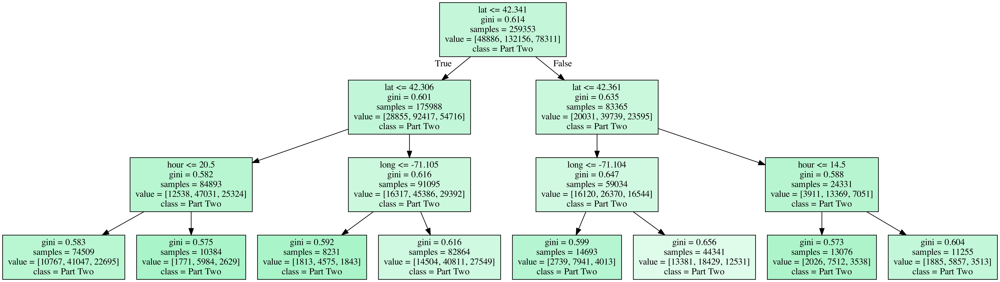

In [36]:
!pip install shap

In [37]:
row_to_show = 10
data_for_prediction = X_test.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)

clf.predict_proba(data_for_prediction_array)

array([[0.33898305, 0.16949153, 0.49152542]])

In [38]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(clf)

# Calculate Shap values
shap_values = explainer.shap_values(data_for_prediction)

In [39]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_for_prediction)


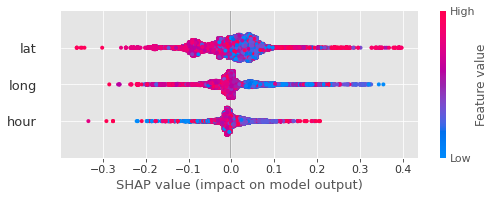

In [40]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(clf)

# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(X_test)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1],X_test)

For every dot:

Vertical location shows what feature it is depicting
Color shows whether that feature was high or low for that row of the dataset
Horizontal location shows whether the effect of that value caused a higher or lower prediction.

Classification Acc 	 Train: 0.524617027757535
Classification Acc 	 Test: 0.5228797482996345


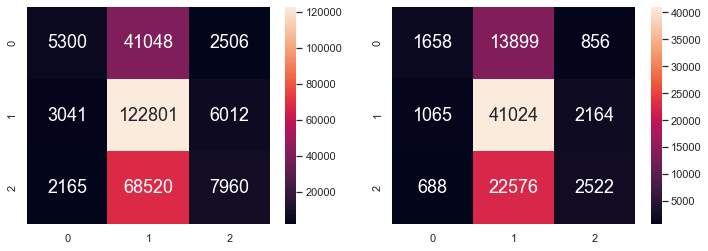

In [41]:
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()
from sklearn.metrics import confusion_matrix
print("Classification Acc \t Train:", clf.score(X_train, y_train))
print("Classification Acc \t Test:", clf.score(X_test, y_test))

y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

f, axes = plt.subplots(1,2,figsize=(12,4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
          annot = True, fmt=".0f", annot_kws={"size":18}, ax=axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred),
          annot = True, fmt=".0f", annot_kws={"size":18}, ax=axes[1])

In [42]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred))

[[ 1658 13899   856]
 [ 1065 41024  2164]
 [  688 22576  2522]]
              precision    recall  f1-score   support

    Part One       0.49      0.10      0.17     16413
  Part Three       0.53      0.93      0.67     44253
    Part Two       0.46      0.10      0.16     25786

    accuracy                           0.52     86452
   macro avg       0.49      0.38      0.33     86452
weighted avg       0.50      0.52      0.42     86452



# Random Forest

In [43]:
#Create a Gaussian Classifier
clf2=RandomForestClassifier(n_estimators=300, criterion = 'entropy',
                             max_depth = 30,
                             min_samples_leaf = 20,
                             min_samples_split = 30,
                             random_state = 42)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf2.fit(X_train,y_train)

y_pred=clf2.predict(X_test)

In [44]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5354416323508999


In [45]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 2032 12810  1571]
 [ 1092 39701  3460]
 [  853 20376  4557]]
              precision    recall  f1-score   support

    Part One       0.51      0.12      0.20     16413
  Part Three       0.54      0.90      0.68     44253
    Part Two       0.48      0.18      0.26     25786

    accuracy                           0.54     86452
   macro avg       0.51      0.40      0.38     86452
weighted avg       0.52      0.54      0.46     86452



In [46]:
#a = pd.merge(X_test, y_test.to_frame(), left_index=True, right_index=True)
#df4 = a[a['ucr_part'] == 'Part One'] 
#df5 = a[a['ucr_part'] == 'Part Two'] 
#df6 = a[a['ucr_part'] == 'Part Three'] 
#
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df4['long'], y=df4['lat'],
#                    mode='markers', name='Part One',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Yellow',
#                width=2
#            )
#        ) 
#                        ))
#fig.add_trace(go.Scatter(x = df5['long'] , y=df5['lat'],
#                    mode='markers', name='Part Two',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Blue',
#                width=2
#            )
#        )
#                        ))
#fig.add_trace(go.Scatter(x = df6['long'] , y=df6['lat'],
#                    mode='markers', name='Part Three',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Green',
#                width=2
#            )
#        )
#                        ))
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    title = "Geographical Distribution of real data in the UCR categories",
#    template = "plotly_white",
#    autosize=False,
#    width=681,
#    height=450,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#    paper_bgcolor="#dba1a1",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#))
#
#fig.update_xaxes(title='latitude')
#fig.update_yaxes(title='longitude')
#
#fig.show()
#
#c = pd.DataFrame(data=y_pred,    # values
#             index=X_test.index,    # 1st column as index
#            columns=['ucr_part'])  # 1st row as the column names
#b = pd.merge(X_test, c, left_index=True, right_index=True)
#df7 = b[b['ucr_part'] == 'Part One'] 
#df8 = b[b['ucr_part'] == 'Part Two'] 
#df9 = b[b['ucr_part'] == 'Part Three'] 
#
## Create traces
#fig = go.Figure()
##create each categories 
#fig.add_trace(go.Scatter(x = df7['long'], y=df7['lat'],
#                    mode='markers', name='Part One',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Yellow',
#                width=2
#            )
#        ) 
#                        ))
#fig.add_trace(go.Scatter(x = df8['long'] , y=df8['lat'],
#                    mode='markers', name='Part Two',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Blue',
#                width=2
#            )
#        )
#                        ))
#fig.add_trace(go.Scatter(x = df9['long'] , y=df9['lat'],
#                    mode='markers', name='Part Three',opacity=0.8, marker=dict(
#            color='White',
#            size=5,
#            line=dict(
#                color='Green',
#                width=2
#            )
#        )
#                        ))
#
## adjusting size of graph, legend place, and background colour
#fig.update_layout(
#    title = "Geographical Distribution of predicted data in the UCR categories",
#    template = "plotly_white",
#    autosize=False,
#    width=681,
#    height=450,
#    margin=dict(
#        l=50,
#        r=50,
#        b=100,
#        t=100,
#        pad=4
#    ),
#    paper_bgcolor="#dba1a1",
#    legend=dict(
#        orientation="h",
#        yanchor="bottom",
#        y=1.02,
#        xanchor="right",
#        x=1
#))
#
#fig.update_xaxes(title='latitude')
#fig.update_yaxes(title='longitude')
#
#fig.show()

In [47]:
pd.DataFrame(data=y_pred,    # values
             index=X_test.index,    # 1st column as index
            columns=['ucr_part'])  # 1st row as the column names

,ucr_part
311081,Part Three
120065,Part Three
301127,Part Two
180616,Part Three
250100,Part Three
...,...
42427,Part Three
139319,Part Two
21679,Part Three
281481,Part Three


In [48]:
y_test.to_frame()

,ucr_part
311081,Part Two
120065,Part One
301127,Part Two
180616,Part Three
250100,Part Three
...,...
42427,Part Two
139319,Part Two
21679,Part One
281481,Part Two


In [49]:
pd.merge(X_test, y_test.to_frame(), left_index=True, right_index=True)

,hour,lat,long,ucr_part
311081,9,42.321072,-71.085104,Part Two
120065,12,42.366008,-71.064035,Part One
301127,9,42.305815,-71.109627,Part Two
180616,0,42.285534,-71.094230,Part Three
250100,14,42.288411,-71.047101,Part Three
...,...,...,...,...
42427,17,42.272291,-71.072228,Part Two
139319,12,42.329259,-71.084824,Part Two
21679,15,42.356989,-71.060849,Part One
281481,12,42.294803,-71.061751,Part Two


# Neural networks 

In [50]:
!pip install tensorflow

In [51]:
!pip install --upgrade tensorflow

In [63]:
import tensorflow as tf
df

,incident_number,offense_code_group,district,shooting,year,month,day_of_week,hour,ucr_part,street,lat,long
37,I192082859,Auto Theft,E18,NaN,2019,10,Sunday,9,Part One,LINCOLN ST,42.259518,-71.121563
38,I192082751,Auto Theft,E18,NaN,2019,10,Saturday,20,Part One,METROPOLITAN AVE,42.262092,-71.116710
39,I192082680,Auto Theft,D14,NaN,2019,10,Saturday,15,Part One,ALLSTON ST,42.352375,-71.135096
40,I192082577,Auto Theft,D4,NaN,2019,10,Saturday,4,Part One,SAINT JAMES AVE,42.349476,-71.076402
41,I192079582,Auto Theft,A15,NaN,2019,10,Wednesday,8,Part One,N MEAD ST,42.381846,-71.066551
...,...,...,...,...,...,...,...,...,...,...,...,...
426887,I020691165-00,Warrant Arrests,A1,NaN,2019,5,Thursday,8,Part Three,NEW SUDBURY ST,42.361839,-71.059765
426888,I020674147-00,Warrant Arrests,A1,NaN,2019,5,Thursday,8,Part Three,NEW SUDBURY ST,42.361839,-71.059765
426889,I020669075-00,Warrant Arrests,A1,NaN,2019,5,Thursday,8,Part Three,NEW SUDBURY ST,42.361839,-71.059765
426890,I020662996-00,Warrant Arrests,A1,NaN,2019,5,Thursday,8,Part Three,NEW SUDBURY ST,42.361839,-71.059765


In [64]:
df0 = df[['long','lat','ucr_part']]
df0['ucr_part'] = pd.Categorical(df0['ucr_part'])
df0['ucr_part'] = df0.ucr_part.cat.codes
target = df0.pop('ucr_part')
dataset = tf.data.Dataset.from_tensor_slices((df0.values, target.values))
for feat, targ in dataset.take(5):
  print ('Features: {}, Target: {}'.format(feat, targ))
#tf.constant(dataset['ucr_part'])
train_dataset = dataset.shuffle(len(df0)).batch(1)

Features: [-71.12156299  42.25951765], Target: 0
Features: [-71.11670964  42.26209214], Target: 0
Features: [-71.13509584  42.35237455], Target: 0
Features: [-71.0764015   42.34947586], Target: 0
Features: [-71.06655134  42.38184582], Target: 0


In [66]:
import tensorflow as tf

class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.8):
      print("\nReached 80% accuracy so cancelling training!")
      self.model.stop_training = True


callbacks = myCallback()



model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation=tf.nn.relu),
  tf.keras.layers.Dense(3, activation=tf.nn.softmax)
])
model.compile(optimizer=tf.optimizers.Adam(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


model.fit(train_dataset, epochs=5, callbacks=[callbacks])

Epoch 1/5
345805/345805 [==============================] - 205s 591us/step - loss: 1.0639 - accuracy: 0.4922
Epoch 2/5
345805/345805 [==============================] - 208s 599us/step - loss: 1.0203 - accuracy: 0.5091
Epoch 3/5
345805/345805 [==============================] - 190s 548us/step - loss: 1.0202 - accuracy: 0.5092
Epoch 4/5
345805/345805 [==============================] - 474s 1ms/step - loss: 1.0204 - accuracy: 0.5096
Epoch 5/5
345805/345805 [==============================] - 378s 1ms/step - loss: 1.0195 - accuracy: 0.5100
